# Токи ФЭУ в 2013г. во всех каналах.

In [1]:
!pwd
!date
!ls
#/home/sphere/ExpData/2013/params/currents
#Ср фев  5 21:31:54 MSK 2020

/home/alena/SPHERE/ExpData/2013/Params/currents
Пн фев 10 13:18:43 MSK 2020
1currents.txt	       currents_2013_vip.txt
2currents.txt	       Currents_2013-with_calibrations.ipynb
3currents.txt	       Hamamatsu_2012.ipynb
4currents.txt	       Hamamatsu_2013.ipynb
5currents.txt	       Hamamatsu_currents_2013.ipynb
cur2013_PMT1.eps       High_ham.2012.csv
curr_all.dat	       High_ham.2012.dat
currents_2012.txt      High_ham.2013.csv
Currents_2013.ipynb    High_ham.dat
currents_2013_pmt.txt  scripts
currents_2013.txt


In [2]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mp
from tqdm import tqdm
import math as mt
import numpy as np
from matplotlib import dates
import datetime as dt

In [3]:
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [4]:
plt.rcParams['figure.figsize'] =(8,4)
plt.rcParams['lines.markersize'] = 3.5
plt.rcParams['lines.markeredgewidth'] = 1
plt.rcParams['lines.linewidth'] = 1
plt.rcParams['grid.alpha'] = 0.7
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['font.size'] = 14
plt.rcParams['figure.max_open_warning'] = 110

### Токи в событиях

In [5]:
''' datum - токи по событиям '''
datum = []
for i in range(1, 6):
    filename = str(i) + 'currents.txt'
    data = pd.read_csv(filename, header = 0, index_col=0, sep='\t')
    data['run'] = i
    datum.append(data)
datum = pd.concat(datum)
print(len(datum))
print(datum.shape)

3801
(3801, 115)


In [6]:
datum.head(2)

,H,time,cur1,cur2,cur3,cur4,cur5,cur6,cur7,cur8,...,cur104,cur105,cur106,cur107,cur108,cur109,cur110,cur111,cur112,run
N,,,,,,,,,,,,,,,,,,,,,
10675,307.8,13:13:07,3.0,7.1,4.1,3.5,7.5,5.3,6.5,8.3,...,3.0,13.9,4.2,2.3,8.2,2.8,0.0,0.0,0.0,1
10676,307.8,13:13:07,3.0,7.1,4.1,3.5,7.5,5.3,6.5,8.3,...,3.0,13.9,4.2,2.3,8.2,2.8,0.0,0.0,0.0,1


Нарисуем 1 канал

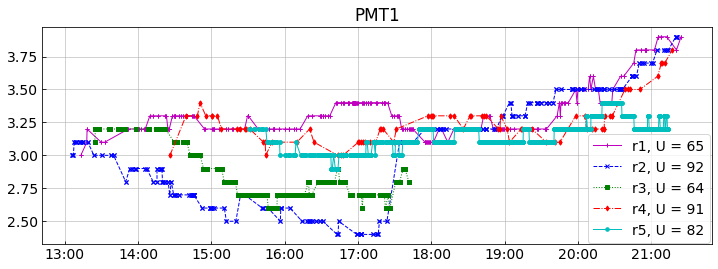

In [7]:
''' Токи в первом канале '''
fmt = dates.DateFormatter('%H:%M')
plcol = ['m+-','bx--', 'gs:', 'rd-.', 'co-']
high = [65,92,64,91,82]

pmt = 1
cur = 'cur' + str(pmt)

plt.rcParams['figure.figsize'] = (12,4)
fig, ax = plt.subplots()
for i in range(1, 6):
    data = datum[datum.run == i]
    x = [dt.datetime.strptime(i, "%H:%M:%S") for i in data.time]
    y = data[cur]
    label = 'r' + str(i) + ', U = ' + str(high[i-1])
    ax.plot(x, y, plcol[i-1], label = label)
    
ax.xaxis.set_major_formatter(fmt)
ax.set_title('PMT' + str(pmt))
#fig.autofmt_xdate()
plt.legend(borderaxespad=0.1)
plt.grid()

### Ежеминутные токи

In [8]:
''' Прочитать токи поминутные '''
filename = "currents_2013_pmt.txt"
currs = pd.read_csv(filename, header = 0, index_col=None, sep='\t')
currs.head()

,flight,datatime,1,2,3,4,5,6,7,8,...,100,101,102,103,104,105,106,107,108,109
0,1,13:17:04,3.126,7.723,4.336,3.822,8.600,5.757,8.812,10.536,...,3.398,2.491,5.062,2.824,3.398,15.526,4.457,2.703,8.389,3.156
1,1,13:18:04,3.156,7.663,4.275,3.852,8.631,5.727,8.842,10.566,...,3.398,2.582,5.092,2.794,3.429,15.556,4.427,2.703,8.510,3.156
2,1,13:19:04,3.096,7.572,4.124,3.852,8.661,5.727,8.903,10.596,...,3.429,2.642,5.062,2.794,3.429,15.617,4.427,2.733,8.510,3.187
3,1,13:20:04,3.126,7.633,4.154,3.852,8.661,5.697,8.963,10.627,...,3.398,2.642,5.062,2.794,3.429,15.587,4.396,2.733,8.479,3.187
4,1,13:22:05,3.126,7.602,4.548,3.882,8.691,5.697,8.994,10.627,...,3.368,2.763,5.062,2.763,3.489,15.647,4.396,2.733,8.389,3.217


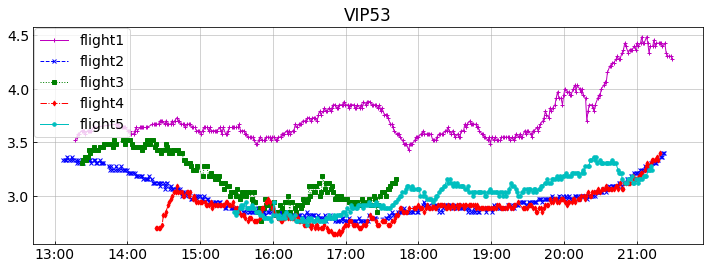

In [9]:
''' Проверка - первый канал '''
fmt = dates.DateFormatter('%H:%M')
plcol = ['m+-','bx--', 'gs:', 'rd-.', 'co-']
high = [65,92,64,91,82]

vip = 53
cur = str(vip)

plt.rcParams['figure.figsize'] = (12,4)
fig, ax = plt.subplots()
for i in range(1, 6):
    data = currs[currs.flight == i]
    x = [dt.datetime.strptime(i, "%H:%M:%S") for i in data.datatime]
    y = data[cur]
    label = 'flight' + str(i)
    ax.plot(x, y, plcol[i-1], label = label)
    
ax.xaxis.set_major_formatter(fmt)
ax.set_title('VIP' + str(vip))
plt.legend(borderaxespad=0.1)
plt.grid()

### Все токи поканально

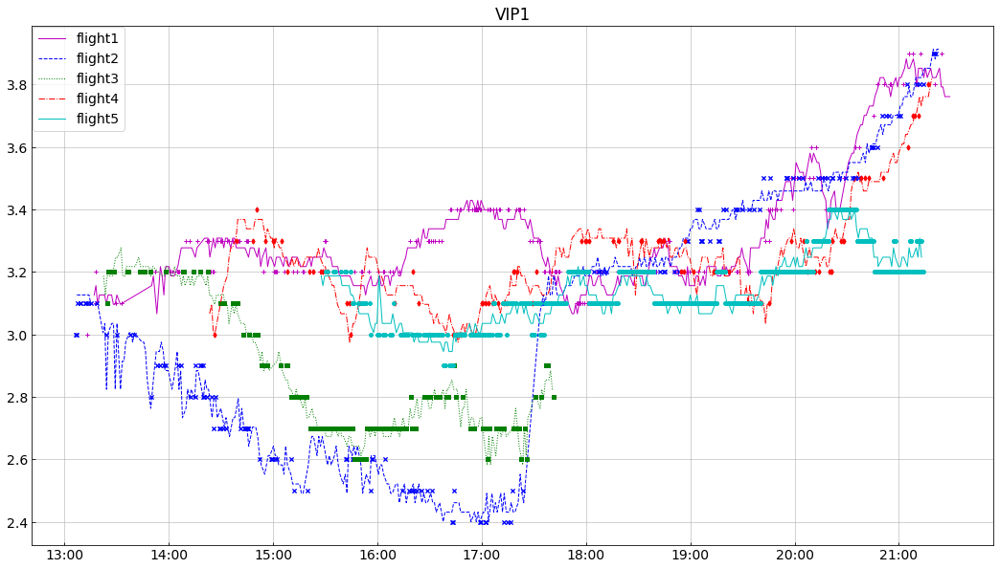

In [10]:
''' для начала строим первый канал '''
fmt = dates.DateFormatter('%H:%M')
plcol = ['m+','bx', 'gs', 'rd', 'co']
cucol = ['m-', 'b--',  'g:', 'r-.', 'c-']
high = [65,92,64,91,82]

vip = str(1)
pmt = 1
cur = 'cur' + str(pmt)

plt.rcParams['figure.figsize'] = (18,10)
fig, ax = plt.subplots()
for i in range(1, 6):
    data = currs[currs.flight == i]
    x = [dt.datetime.strptime(i, "%H:%M:%S") for i in data.datatime]
    y = data[vip]
    label = 'flight' + str(i)
    ax.plot(x, y, cucol[i-1], label = label)
    
    data = datum[datum.run == i]
    x = [dt.datetime.strptime(i, "%H:%M:%S") for i in data.time]
    y = data[cur]
    ax.plot(x, y, plcol[i-1])

ax.xaxis.set_major_formatter(fmt)
ax.set_title('VIP' + str(vip))
plt.legend(borderaxespad=0.1)
plt.grid()

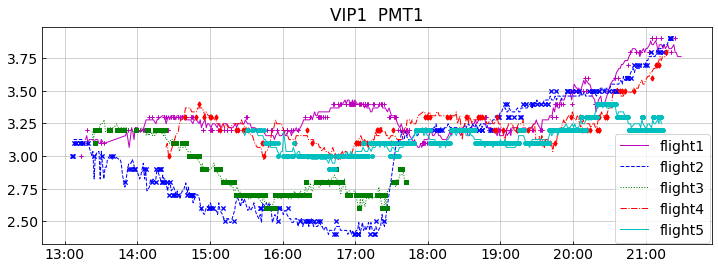

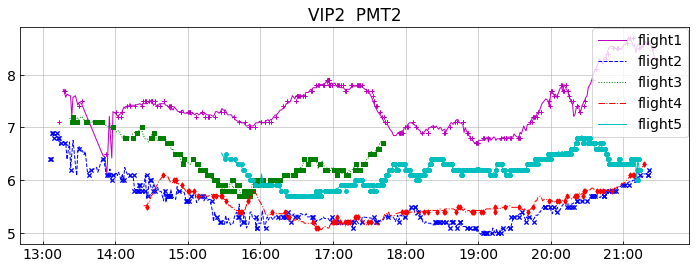

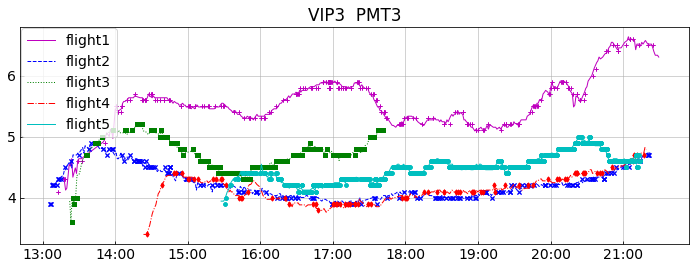

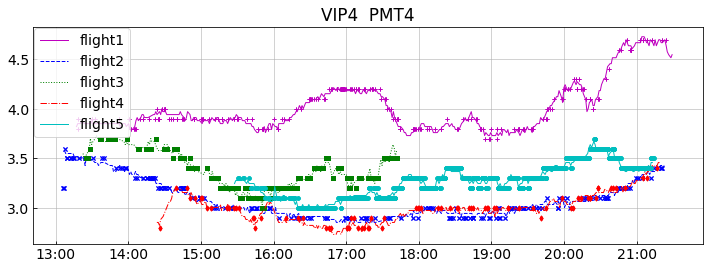

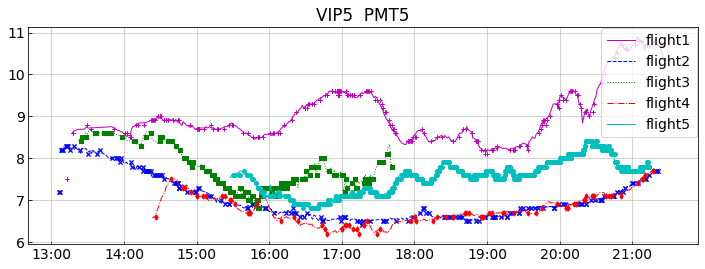

...

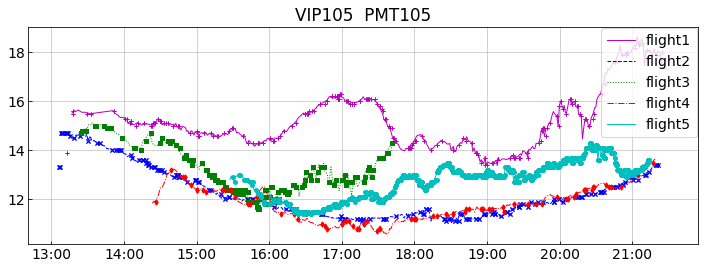

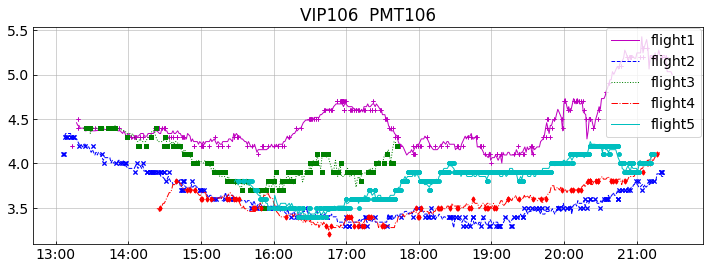

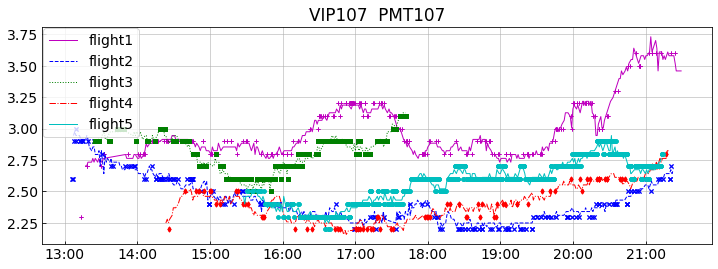

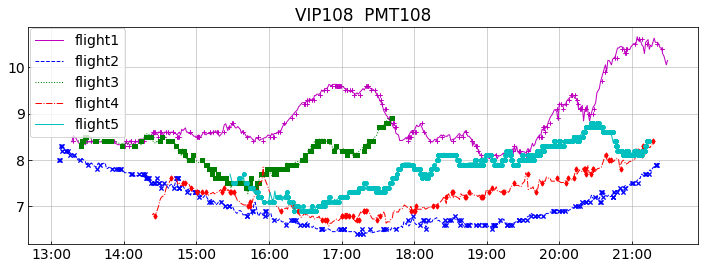

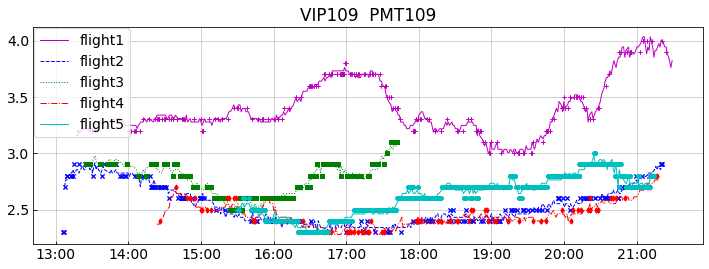

In [11]:
''' все токи (поминутные и пособытийные) поканально '''
fmt = dates.DateFormatter('%H:%M')
plcol = ['m+', 'bx',  'gs', 'rd',  'co']
cucol = ['m-', 'b--', 'g:', 'r-.', 'c-']

for vip in range(1,110): 
    plt.rcParams['figure.figsize'] = (12,4)
    fig, ax = plt.subplots()
    vip = str(vip)
    cur = 'cur' + str(vip)

    for i in range(1, 6):
        # everymin currents
        data = currs[currs.flight == i]
        x = [dt.datetime.strptime(i, "%H:%M:%S") for i in data.datatime]
        y = data[vip]
        label = 'flight' + str(i)
        ax.plot(x, y, cucol[i-1], label = label)

        # current by pmt
        data = datum[datum.run == i]
        x = [dt.datetime.strptime(i, "%H:%M:%S") for i in data.time]
        y = data[cur]
        ax.plot(x, y, plcol[i-1])

    ax.xaxis.set_major_formatter(fmt)
    ax.set_title('VIP' + str(vip) + "  PMT" + str(vip))
    plt.legend(borderaxespad=0.1)
    plt.grid()

# Токи по полетам

###  Поминутные токи по-полётно

Выделяется 91 канал во всех полетах, кроме 4-го.

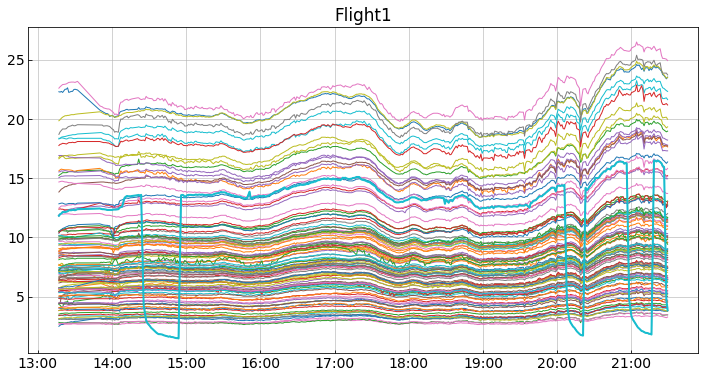

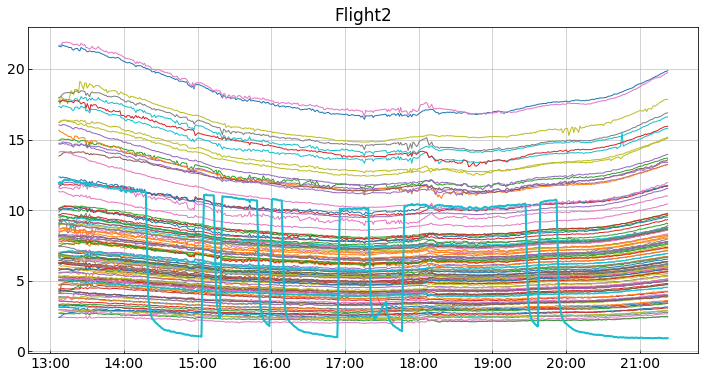

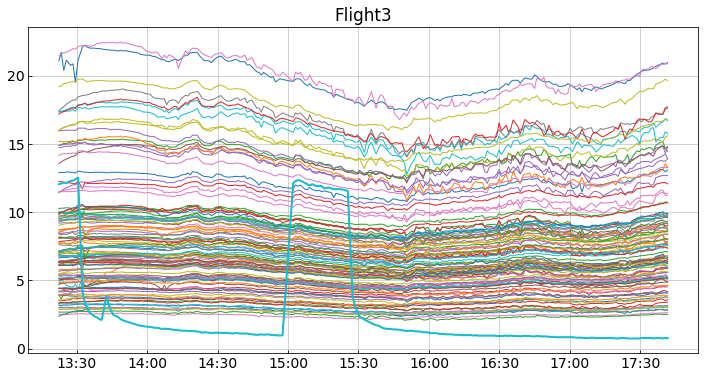

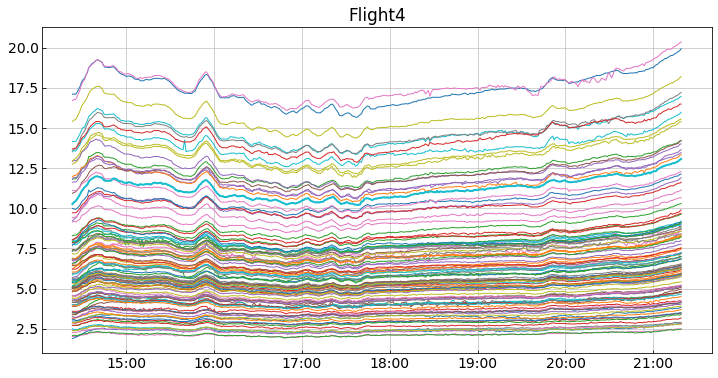

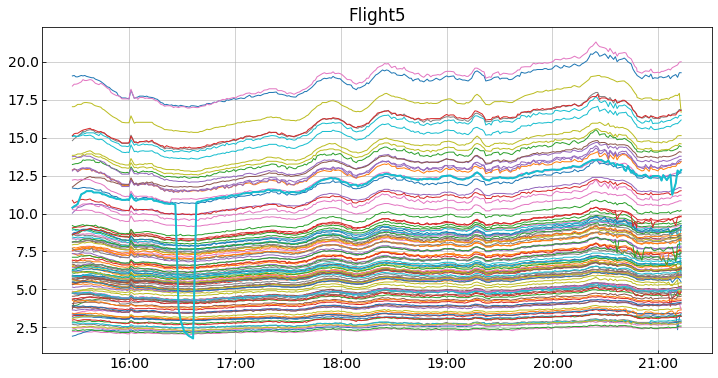

In [12]:
fmt = dates.DateFormatter('%H:%M')

for flight in range(1, 6):
    plt.rcParams['figure.figsize'] = (12,6)
    fig, ax = plt.subplots()
    
    data = currs[currs.flight == flight]
    x = [dt.datetime.strptime(i, "%H:%M:%S") for i in data.datatime]
    
    for vip in range(1,110):   
        vip = str(vip)
        y = data[vip]
        label = 'pmt' + str(vip)
        ax.plot(x, y, label = label)

    # bad channel
    vip = str(91)
    y = data[vip]
    ax.plot(x, y, linewidth = 2)
    
    ax.xaxis.set_major_formatter(fmt)
    ax.set_title('Flight' + str(flight) )
    #fig.autofmt_xdate()
    #plt.legend(borderaxespad=0.1)
    plt.grid()

### Токи событий по-полётно
То же, что и выше, но по событиям

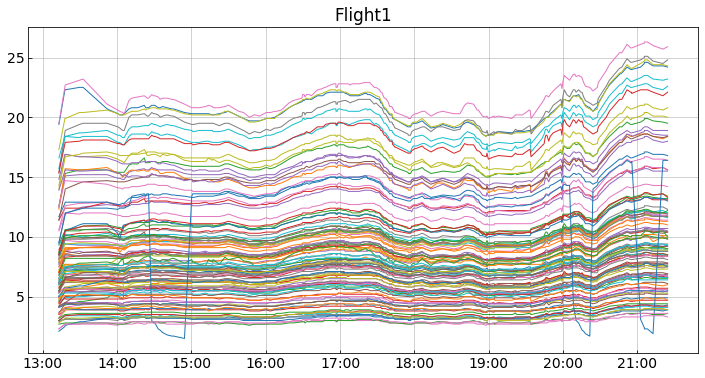

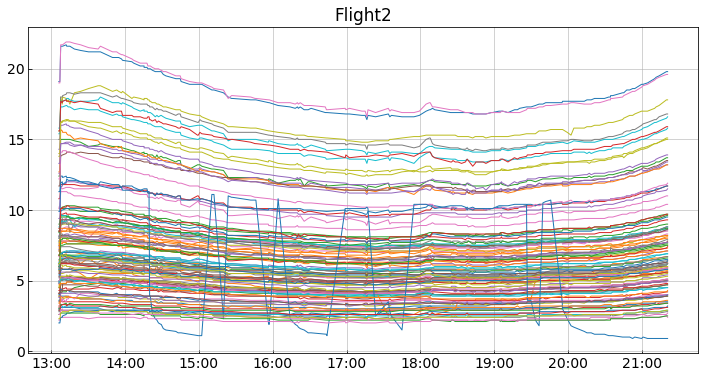

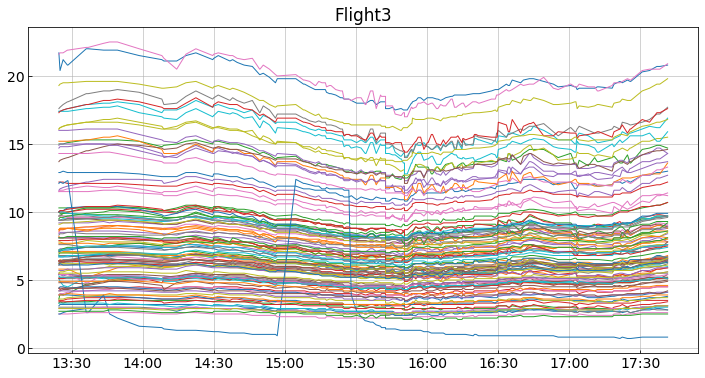

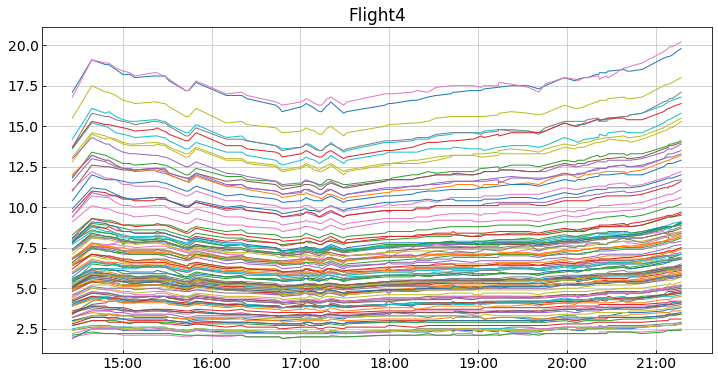

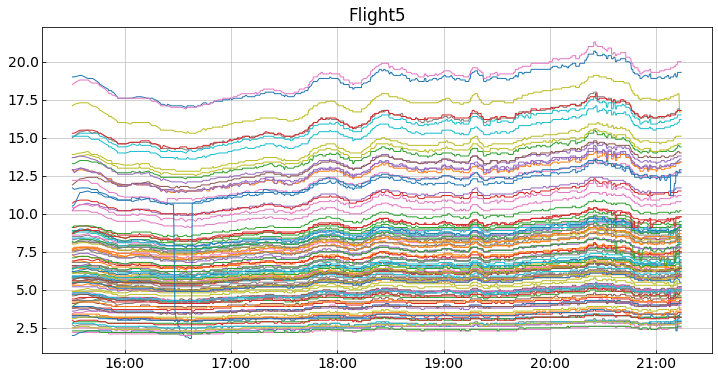

In [13]:
fmt = dates.DateFormatter('%H:%M')

for flight in range(1, 6):
    plt.rcParams['figure.figsize'] = (12,6)
    fig, ax = plt.subplots()
    
    # current by pmt
    data = datum[datum.run == flight]
    x = [dt.datetime.strptime(i, "%H:%M:%S") for i in data.time]
    
        
    for vip in range(1,110):   
        cur = 'cur' + str(vip)
        y = data[cur]
        label = 'pmt' + str(vip)
        ax.plot(x, y, label = label)
    
    ax.xaxis.set_major_formatter(fmt)
    ax.set_title('Flight' + str(flight) )
    #fig.autofmt_xdate()
    #plt.legend(borderaxespad=0.1)
    plt.grid()

Все каналы ведут себя синхронно, за исключением 91 канала.

# Применим коэффициенты калибровки

In [14]:
''' Read calibration coefficients table for events 2013 '''
filename = '../calibr/calibr.csv'
calibr = pd.read_csv(filename, index_col=0)
calibr.head()

,event,0,1,2,3,4,5,6,7,8,...,99,100,101,102,103,104,105,106,107,108
0,10675,1.209435,0.364406,0.615006,0.633775,0.414528,0.602578,0.420613,0.314652,0.400736,...,0.820859,1.122690,0.654889,0.851669,0.914982,0.249634,0.596291,1.102276,0.385714,0.837180
1,10677,1.209435,0.363320,0.598135,0.631097,0.411896,0.593146,0.411219,0.305353,0.405279,...,0.799395,1.113379,0.645516,0.860145,0.908727,0.251465,0.589999,1.054065,0.380087,0.805045
2,10685,1.181357,0.382805,0.530504,0.628542,0.406205,0.607446,0.398918,0.302048,0.411356,...,0.815285,0.865214,0.637030,0.872824,0.912971,0.254938,0.608934,1.044872,0.374366,0.783738
3,10687,1.190989,0.391427,0.525612,0.625985,0.416272,0.628265,0.405165,0.309847,0.413572,...,0.835987,0.862912,0.656271,0.887601,0.939193,0.258490,0.631590,1.089275,0.386307,0.821904
4,10689,1.190989,0.385279,0.522956,0.625651,0.416410,0.618398,0.400843,0.308155,0.412572,...,0.823190,0.863061,0.644325,0.888027,0.912572,0.252713,0.611840,1.057670,0.373001,0.794129


In [15]:
''' Таблица токов для событий '''
datum.head(2)

,H,time,cur1,cur2,cur3,cur4,cur5,cur6,cur7,cur8,...,cur104,cur105,cur106,cur107,cur108,cur109,cur110,cur111,cur112,run
N,,,,,,,,,,,,,,,,,,,,,
10675,307.8,13:13:07,3.0,7.1,4.1,3.5,7.5,5.3,6.5,8.3,...,3.0,13.9,4.2,2.3,8.2,2.8,0.0,0.0,0.0,1
10676,307.8,13:13:07,3.0,7.1,4.1,3.5,7.5,5.3,6.5,8.3,...,3.0,13.9,4.2,2.3,8.2,2.8,0.0,0.0,0.0,1


###### Выбросим три события из-за аномальных коэффициентов
    11542 - k = -4973.8049 - в 32 канале большой отрицательный коэффициент 
    10689 - k = 9.077483   - в 32 канале большой коэффициент
    11534 - большие коэффициенты во всех каналах

In [26]:
''' Посчитаем таблицу откалиброванных токов - 
умножим  токи на коэффициенты калибровки'''
calevents = pd.DataFrame(columns=[str(x) for x in range(109)])
#ignore = [10689, 11282, 11288, 11360, 11430, 11426, 11534, 11542, 11576, 11652, 11766]
ignore = [11542, 10689, 11534]
events = []
runs   = []
times  = []
num  = 0

for event in datum.index[:]:
    if event in ignore:
        print(event, "Ignored")
        continue

    ## --- взять калибровки
    cals = calibr[calibr.event == event].values
    if len(cals) == 0:
        # print(event, "No calibrations")
        continue
    cals = cals[0][1:]
    #print(event, "cals:", cals, len(cals))

    ## --- взять токи событий
    #print(event, num) #, calevents)
    curs = datum.loc[event].values[2:2+109]
    #print(event, curs, len(curs))
    
    ## --- умножить токи на калибровки
    calcur = cals * curs
    #print(calcur)   
    
    ## cохранить в таблицу
    calevents.loc[num] = calcur
    events.append(event)
    runs.append(datum.loc[event].values[-1])
    times.append(datum.loc[event].time)
    num += 1

print(len(events), len(runs) )
calevents["event"]  = events
calevents["flight"] = runs
calevents["time"]   = times

10689 Ignored
11534 Ignored
11542 Ignored
1725 1725


In [17]:
calevents.head(2)

,0,1,2,3,4,5,6,7,8,9,...,102,103,104,105,106,107,108,event,flight,time
0,3.628305,2.587283,2.521526,2.218212,3.108956,3.193666,2.733987,2.611612,2.925370,2.883673,...,2.299506,2.744946,3.469918,2.504422,2.535235,3.162854,2.344104,10675,1,13:13:07
1,3.749248,2.797564,2.571981,2.398169,3.542303,3.440249,3.618723,3.206207,3.120647,3.010406,...,2.408407,3.089673,3.897709,2.654998,2.845976,3.192732,2.576143,10677,1,13:17:59


## Откалиброванные токи по полетам

Нарисуем откалиброванные токи по полетам. 
Токи строятся по событиям (без трех событий: 11542, 10689, 11534) поскольку коэффициенты рассчитаны для событий. 

Выбросим три канала:
   
    49, 78 - их коэффициенты равны 1
    91 - плохие коэффициенты (большой разброс)

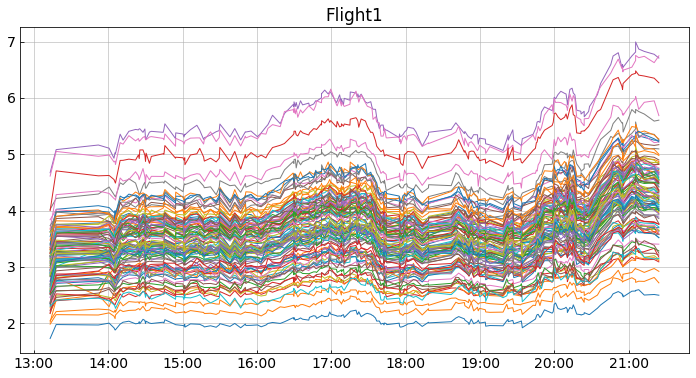

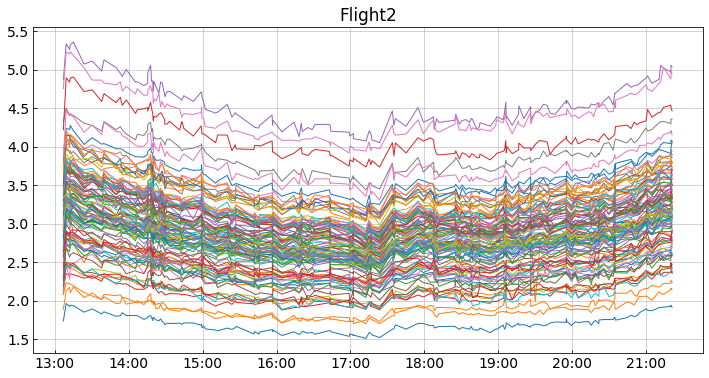

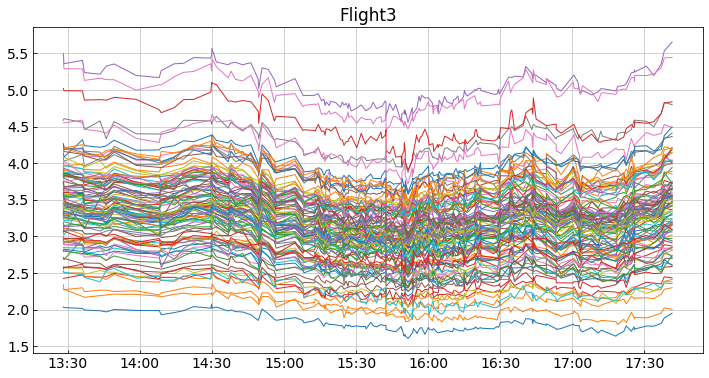

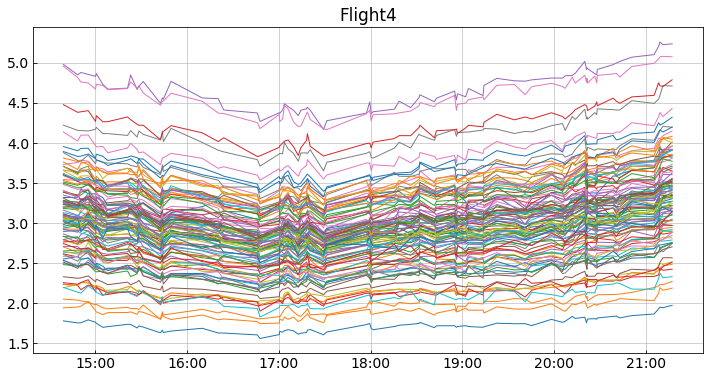

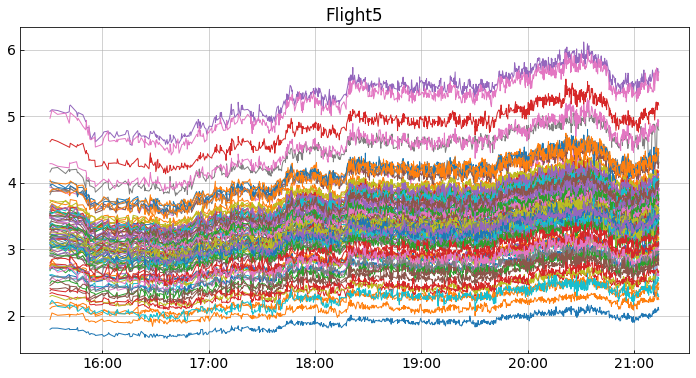

In [41]:
fmt = dates.DateFormatter('%H:%M')
ignore = [49, 78, 90]

for flight in range(1, 6):
    plt.rcParams['figure.figsize'] = (12,6)
    fig, ax = plt.subplots()
    data = calevents[calevents.flight == flight]
    x = [dt.datetime.strptime(i, "%H:%M:%S") for i in data.time]   
        
    for vip in range(109):
        if vip in ignore:
            #print(vip, "ignored")
            continue
        cur = str(vip)
        y = data[cur]
        #y = y[abs(y)< 30]
        label = 'pmt' + str(vip)
        ax.plot(x, y, label = label)   
    
    #vip = 90
    #cur = str(vip)
    #y = data[cur]
    #ax.plot(x, y, linewidth = 5)  
    
    ax.xaxis.set_major_formatter(fmt)
    ax.set_title('Flight' + str(flight) )
    plt.grid()
    filename = "Cur2013calibr_fl" + str(flight)
    #plt.savefig(filename + ".eps", bbox_inches='tight') 
    plt.savefig(filename + ".png", bbox_inches='tight') 

### Откалиброванные токи по каналам

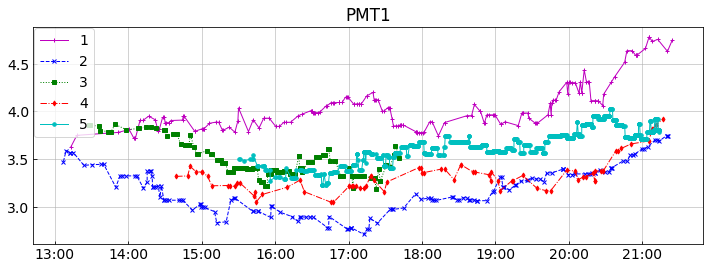

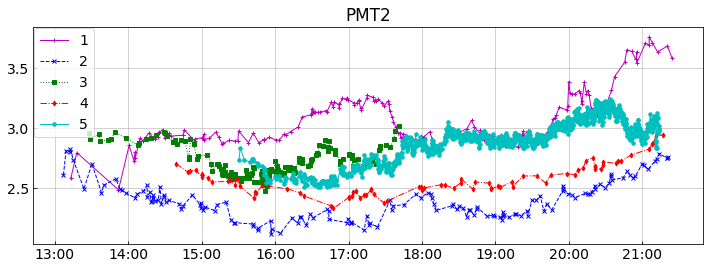

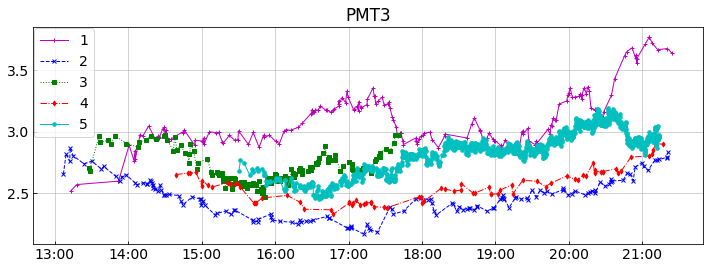

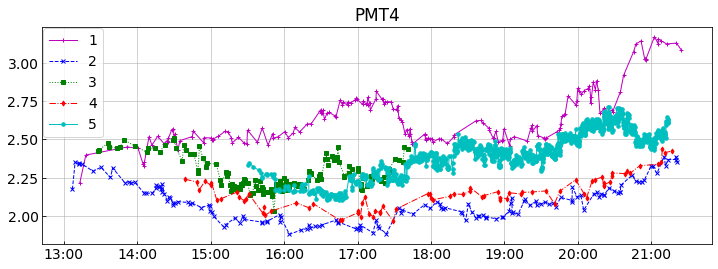

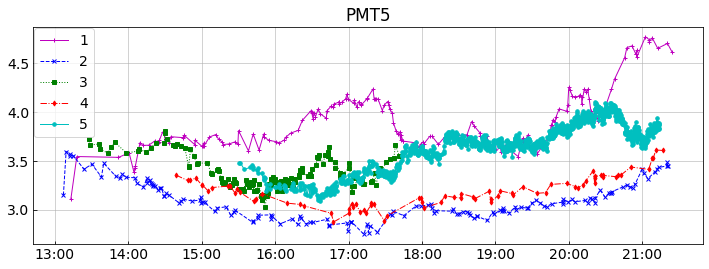

...

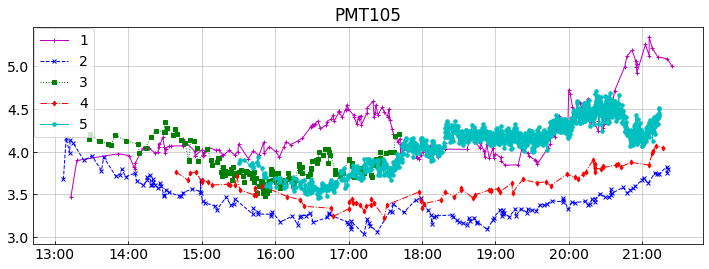

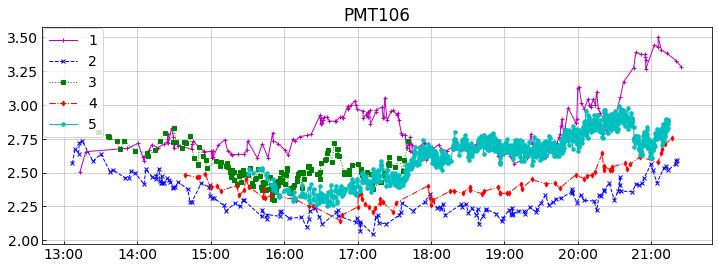

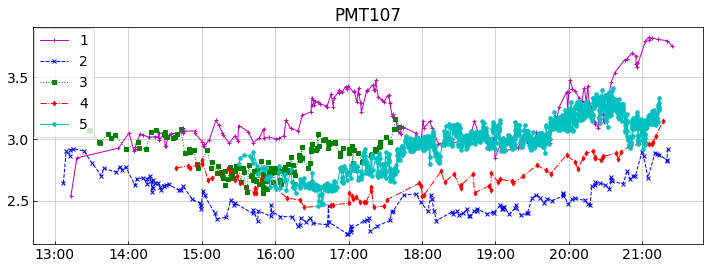

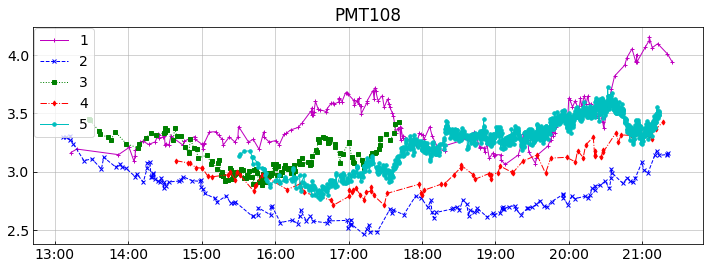

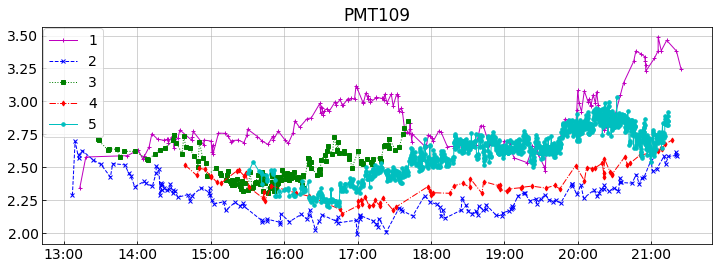

In [29]:
fmt = dates.DateFormatter('%H:%M')
plcol = ['m+-','bx--', 'gs:', 'rd-.', 'co-']
plt.rcParams['figure.figsize'] = (12,4)

for pmt in range(109):
    fig, ax = plt.subplots()
    cur = str(pmt)
    for flight in range(1, 6):
        data = calevents[calevents.flight == flight]
        x = [dt.datetime.strptime(i, "%H:%M:%S") for i in data.time]
        y = data[cur]
        ax.plot(x, y, plcol[flight-1], label = str(flight))

    ax.xaxis.set_major_formatter(fmt)
    ax.set_title('PMT' + str(pmt+1))
    plt.legend(borderaxespad=0.1)
    plt.grid()

### Отдельно 91 канал c ограничением по осям на ток

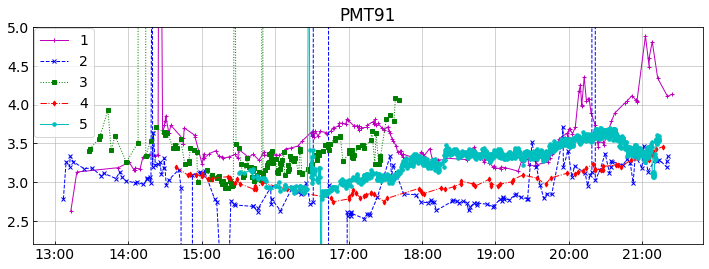

In [37]:
pmt = 90
fig, ax = plt.subplots()
cur = str(pmt)
for flight in range(1, 6):
    data = calevents[calevents.flight == flight]
    #data = data[(data[cur] < 1000) & (data[cur] > 0)]
    x = [dt.datetime.strptime(i, "%H:%M:%S") for i in data.time]
    y = data[cur]
    ax.plot(x, y, plcol[flight-1], label = str(flight))

plt.ylim(2.2,5)
ax.xaxis.set_major_formatter(fmt)
ax.set_title('PMT' + str(pmt+1))
plt.legend(borderaxespad=0.1)
plt.grid()